In [1]:
import sys
sys.path.append('../')  
sys.path.append('../model')

from custom_loss_functions import psnr

from tensorflow.keras.models import load_model
from hformer_model import get_hformer_model, PatchExtractor
from skimage.metrics import structural_similarity as ssim

from skimage.util import view_as_blocks

import numpy as np

from skimage.metrics import peak_signal_noise_ratio

import tensorflow as tf
from tensorflow import keras
from keras import layers, models
from keras import backend as K

from sklearn.model_selection import train_test_split

from data_importer import load_testing_images
from data_importer import load_training_images, denormalize, trunc

import matplotlib.pyplot as plt


In [2]:
# Common testing image pairs (used to evaluate all models)

noisy_images, ground_truth_images = load_training_images('../../../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data', load_limited_images=True, num_images_to_load=10)

_n, _g = load_training_images('../../../../../../Dataset/LowDoseCTGrandChallenge/Selected_Image_Pairs/', load_limited_images=False)
noisy_images = np.concatenate((noisy_images, _n), axis=0)
ground_truth_images = np.concatenate((ground_truth_images, _g), axis=0)
 
patch_extractor = PatchExtractor(patch_size=64, stride=64, name="patch_extractor")
test_image_patches = patch_extractor(noisy_images)

loaded training images x and y of len :  10 10  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64
loaded training images x and y of len :  5 5  respectively
type of train images x :  float64
range of values in train images :  0.0 0.915283203125
type of train images y :  float64


In [3]:
test_images_with_no_ground_truth = load_testing_images('../../../../../../Dataset/LowDoseCTGrandChallenge/Testing_Image_Data', load_limited_images=True, num_images_to_load=2)
test_image_with_no_gt_patches = patch_extractor(test_images_with_no_ground_truth)

loaded testing images x of len :  2
type of test images x :  float64
range of values in test images :  0.0 0.619140625


Code for evaluation of model(s)

In [4]:
def view_model_history(history, psnr_or_accuracy):
    # Visualize model history.
    print('history keys : ', history.keys())

    # Plot loss, accuracy, val_loss and val_accuracy

    # Get the number of epochs
    num_epochs = len(history['loss'])

    # Plot training and validation accuracy / PSNR values
    if psnr_or_accuracy == 'accuracy':
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, num_epochs + 1), history['accuracy'], label='Training Accuracy')
        plt.plot(range(1, num_epochs + 1), history['val_accuracy'], label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
    elif psnr_or_accuracy == 'psnr':
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, num_epochs + 1), history['psnr'], label='Training psnr')
        plt.plot(range(1, num_epochs + 1), history['val_psnr'], label='Validation psnr')
        plt.title('Training and Validation Psnr')
        plt.xlabel('Epoch')
        plt.ylabel('Psnr')
        plt.legend()
        
    # Plot training and validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), history['loss'], label='Training Loss')
    plt.plot(range(1, num_epochs + 1), history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [5]:
def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))

    # Reconstruct the image by placing each patch in its corresponding position
    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)



In [6]:
from metrics import compute_SSIM, compute_PSNR

def calculate_psnr(original_image, reconstructed_image):
    return compute_PSNR(original_image, reconstructed_image, 240+160.0)

    psnr_value = peak_signal_noise_ratio(original_image, reconstructed_image, data_range=240+160)
    return psnr_value

def calculate_ssim(original_image, reconstructed_image):    
    ssim_value = ssim(original_image.astype(np.float32), reconstructed_image.astype(np.float32), win_size=7,  channel_axis=2, data_range=240+160)
    return ssim_value



In [7]:
def visualize_patches(patches, noisy_images,  ground_truth_images, num_images):
    num_patches_per_image = int(patches.shape[0] / num_images)

    print('patches per image : ', num_patches_per_image)

    print('datatype of patches : ', patches.dtype)

    for i in range(num_images):
        print('this image has start patches : ', i * num_patches_per_image)
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]

        fig, axes = plt.subplots(1, 4, figsize=(30, 30))
        axes = axes.flatten()
        
        reconstruct_image = (trunc(denormalize((reconstruct_image_from_patches(image_patches, 8)))))
        _noisy_image = trunc(denormalize(noisy_images[i]))
        _clean_image = trunc(denormalize(ground_truth_images[i]))
        
        print('range of reconstructed image : ', np.min(reconstruct_image), np.max(reconstruct_image))
        print('range of clean image : ', np.min(_clean_image), np.max(_clean_image))

        print('reconstruct_image shape : ', reconstruct_image.shape)
        print('noisy image shape : ', noisy_images[i].shape)
        
        axes[0].set_title('input image')
        axes[0].imshow(_noisy_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[0].axis('off')
        
        axes[1].set_title('ground truth image')
        axes[1].imshow(_clean_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[1].axis('off')
        
        axes[2].set_title('model prediction')
        axes[2].imshow((reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[2].axis('off')
        
        axes[3].set_title('removed noise')
        axes[3].imshow(trunc(_noisy_image - reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[3].axis('off')
        
        print('PSNR of reconsturcted image : ', calculate_psnr(_clean_image, reconstruct_image))
        print('PSNR of noisy image : ', calculate_psnr(_clean_image, _noisy_image))
        print('SSIM of noisy image : ', calculate_ssim(_clean_image, _noisy_image))
        print('SSIM of reconstructed image : ', calculate_ssim(_clean_image, reconstruct_image))
        
        plt.show()


In [8]:
def visualize_patches_with_no_gt(patches, noisy_images, num_images):
    num_patches_per_image = int(patches.shape[0] / num_images)

    print('datatype of patches : ', patches.dtype)
    
    print('patches per image : ', num_patches_per_image)

    for i in range(num_images):
        print('this image has start patches : ', i * num_patches_per_image)
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]

        fig, axes = plt.subplots(1, 3, figsize=(28, 28))
        axes = axes.flatten()
        
        reconstruct_image = trunc(denormalize((reconstruct_image_from_patches(image_patches, 8))))
 
        print('range of reconstructed image : ', np.min(reconstruct_image), np.max(reconstruct_image))
        print('reconstruct_image shape : ', reconstruct_image.shape)
        print('noisy image shape : ', noisy_images[i].shape)
        
        noisy = trunc(denormalize(noisy_images[i]))
        
        axes[0].set_title('input image')
        axes[0].imshow(noisy, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[0].axis('off')
                
        axes[1].set_title('model prediction')
        axes[1].imshow(reconstruct_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[1].axis('off')
        
        axes[2].set_title('removed noise')
        axes[2].imshow((noisy - reconstruct_image), cmap='gray')
        axes[2].axis('off')

        print('PSNR of reconsturcted image : ', calculate_psnr(trunc(denormalize(ground_truth_images[i])), trunc(denormalize(reconstruct_image))))
        print('SSIM of reconstructed image : ', calculate_ssim(trunc(denormalize(ground_truth_images[i])), trunc(denormalize(reconstruct_image))))

        plt.show()


In [9]:
def evaluate_model(model, history, name, psnr_or_accuracy):
    print('Training history of model : ', name)
    view_model_history(history, psnr_or_accuracy)
    
    print('Model prediction test')
    
    predictions = model.predict(test_image_patches)
    visualize_patches(predictions, noisy_images, ground_truth_images, len(noisy_images))
    print('\n\n\n\n\n')
    
    print('Model prediction test on blind images')    
    predictions = model.predict(test_image_with_no_gt_patches)
    visualize_patches_with_no_gt(predictions, test_images_with_no_ground_truth, len(test_images_with_no_ground_truth))
    print('\n\n\n\n\n')
    

Test on FULL dataset (~14K images before patching)

Model: "hformer_model_extended_64_channel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (Inp  multiple                 320       
 utProjectionLayer)                                              
                                                                 
 output_projection_layer (Ou  multiple                 257       
 tputProjectionLayer)                                            
                                                                 
 conv_net_block_1 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 conv_net_block_2 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 downsampling_layer_1 (Conv2  mul

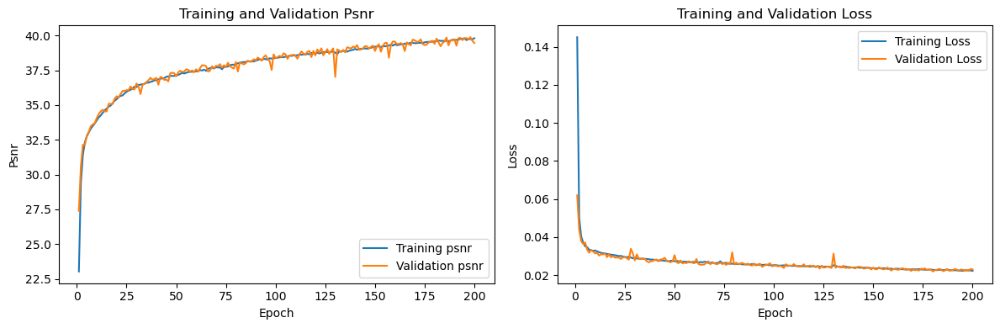

Model prediction test
30/30 [==============================] - 14s 126ms/step
patches per image :  64
datatype of patches :  float32
this image has start patches :  0
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.1806661821385
PSNR of noisy image :  23.485824280503806
SSIM of noisy image :  0.8430164
SSIM of reconstructed image :  0.8819939


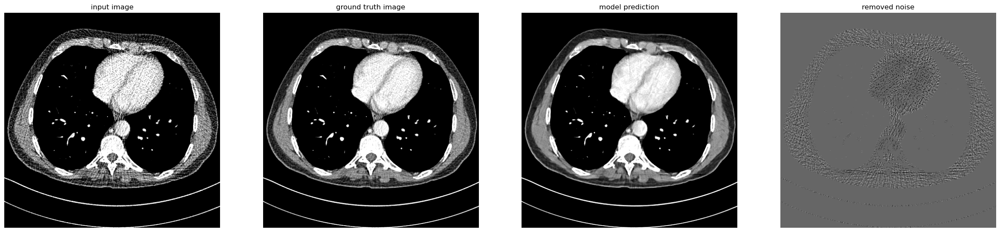

this image has start patches :  64
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.41207252274486
PSNR of noisy image :  23.77072744405735
SSIM of noisy image :  0.8466024
SSIM of reconstructed image :  0.8844273


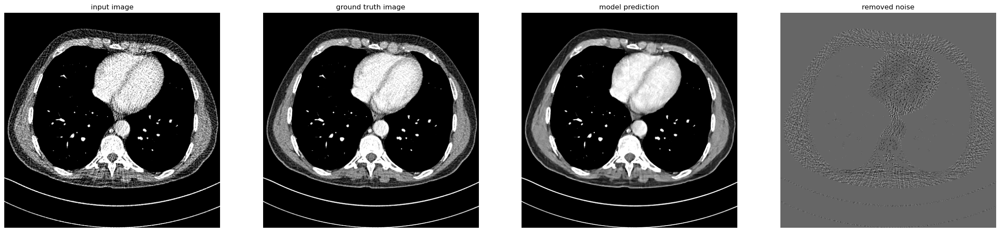

this image has start patches :  128
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.503448298508467
PSNR of noisy image :  23.872244369711602
SSIM of noisy image :  0.84596694
SSIM of reconstructed image :  0.8839931


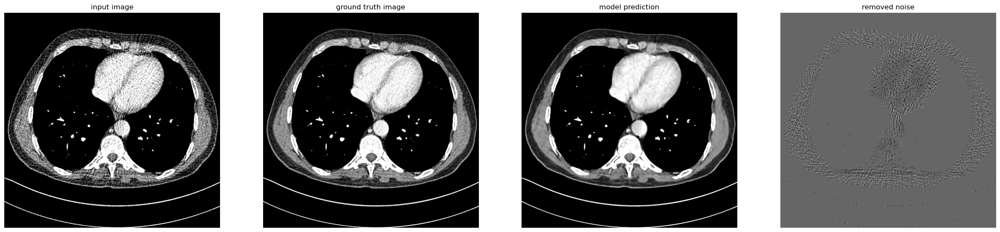

this image has start patches :  192
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.31207846018583
PSNR of noisy image :  23.68181948637809
SSIM of noisy image :  0.84348005
SSIM of reconstructed image :  0.8825492


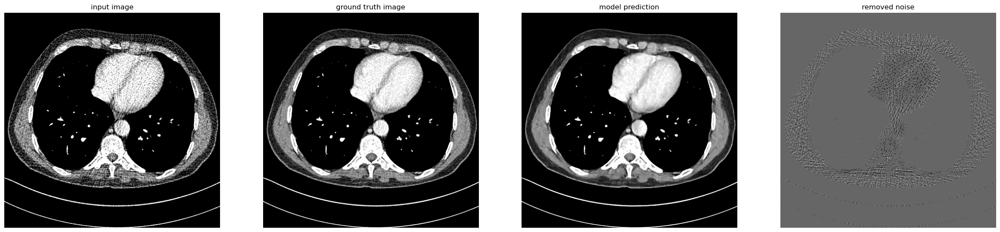

this image has start patches :  256
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.583322671104852
PSNR of noisy image :  23.979451548330296
SSIM of noisy image :  0.8488928
SSIM of reconstructed image :  0.88621247


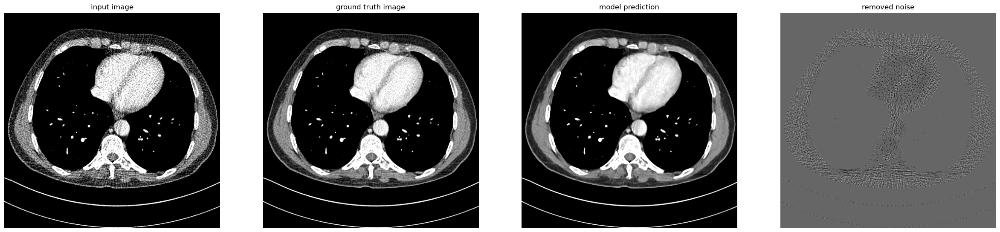

this image has start patches :  320
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.707383665193873
PSNR of noisy image :  24.178606306101663
SSIM of noisy image :  0.8512244
SSIM of reconstructed image :  0.8877762


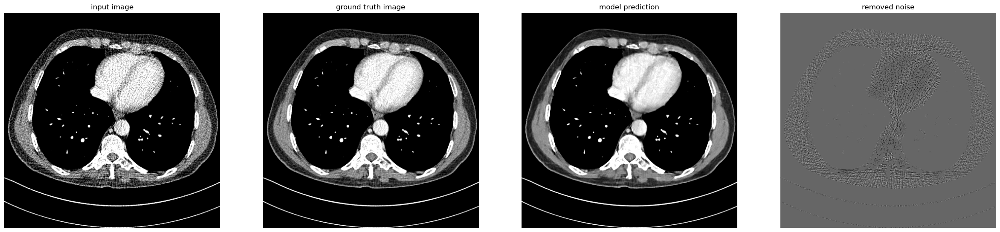

this image has start patches :  384
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.59058502246858
PSNR of noisy image :  23.928403306314998
SSIM of noisy image :  0.8495585
SSIM of reconstructed image :  0.88671076


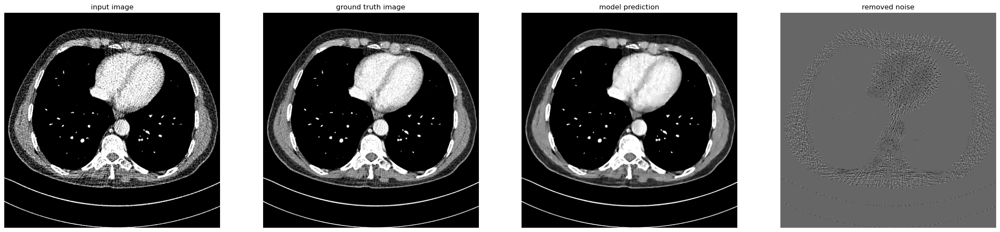

this image has start patches :  448
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.754588646520883
PSNR of noisy image :  24.188060278312804
SSIM of noisy image :  0.85253966
SSIM of reconstructed image :  0.89100856


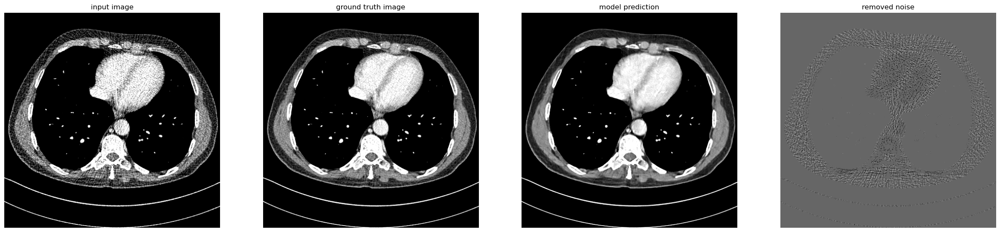

this image has start patches :  512
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.89960271555669
PSNR of noisy image :  24.267820089605138
SSIM of noisy image :  0.85317534
SSIM of reconstructed image :  0.8916597


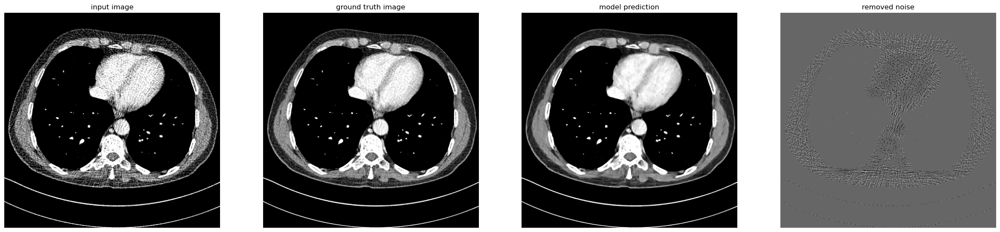

this image has start patches :  576
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.608086419343934
PSNR of noisy image :  24.01930346507163
SSIM of noisy image :  0.8521291
SSIM of reconstructed image :  0.88970923


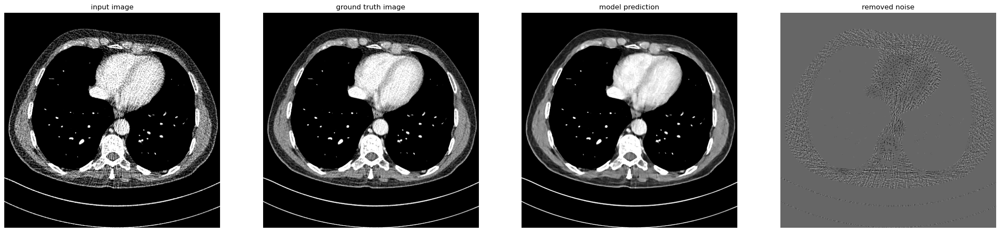

this image has start patches :  640
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  28.29929522790077
PSNR of noisy image :  23.769318678026554
SSIM of noisy image :  0.8361802
SSIM of reconstructed image :  0.86980855


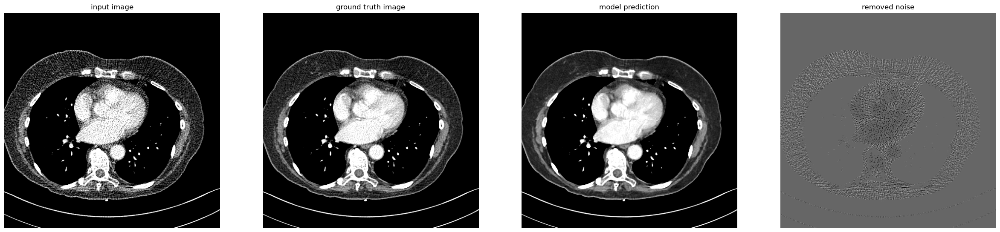

this image has start patches :  704
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  29.744394741020255
PSNR of noisy image :  24.65118878824463
SSIM of noisy image :  0.7820805
SSIM of reconstructed image :  0.83414304


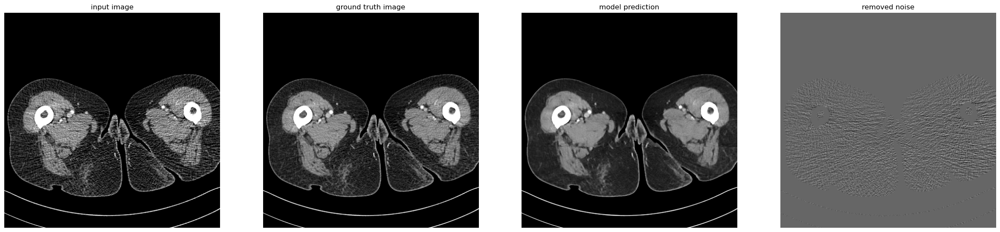

this image has start patches :  768
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  22.84284499940753
PSNR of noisy image :  16.96636129871616
SSIM of noisy image :  0.68414223
SSIM of reconstructed image :  0.7192354


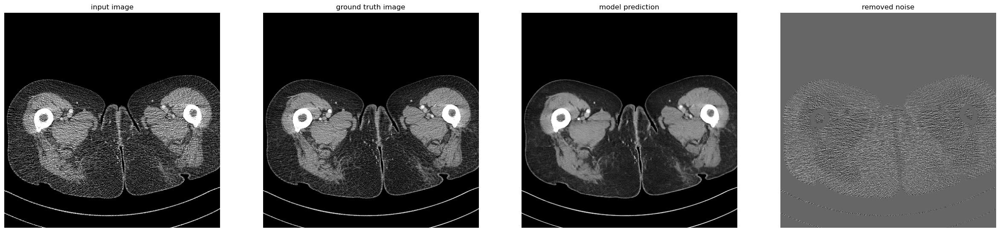

this image has start patches :  832
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  29.476794510956648
PSNR of noisy image :  24.506914598967775
SSIM of noisy image :  0.8172475
SSIM of reconstructed image :  0.85624516


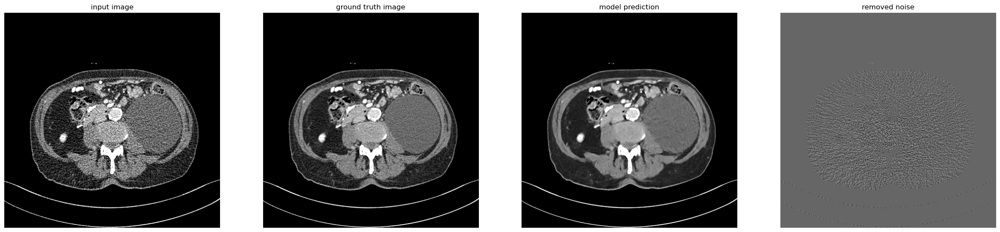

this image has start patches :  896
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  29.87417458879804
PSNR of noisy image :  24.71547001596449
SSIM of noisy image :  0.8647461
SSIM of reconstructed image :  0.89601505


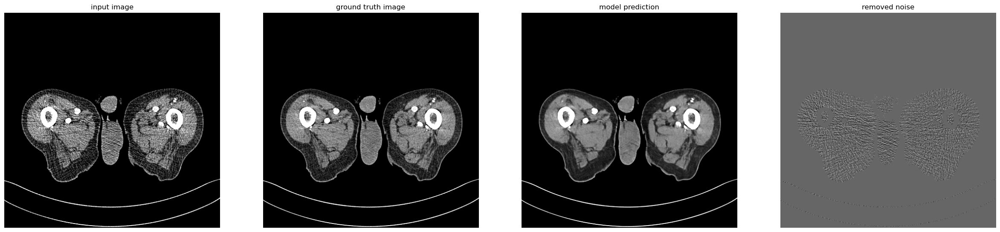







Model prediction test on blind images
4/4 [==============================] - 1s 205ms/step
datatype of patches :  float32
patches per image :  64
this image has start patches :  0
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  8.888388844990331
SSIM of reconstructed image :  0.51607466


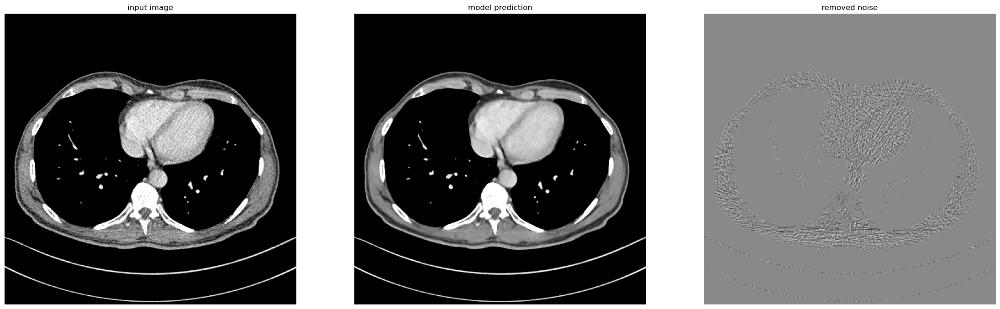

this image has start patches :  64
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  8.903798773330514
SSIM of reconstructed image :  0.5175428


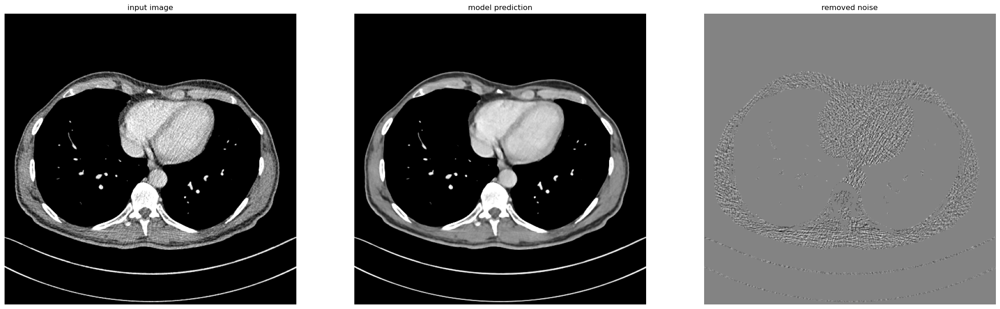

In [10]:
from hformer_model_extended import get_hformer_model

# Get model and build (required for loading weights).
model = get_hformer_model(num_channels_to_be_generated=64, name="hformer_model_extended_64_channel")
model.build(input_shape=(None, 64, 64, 1)) 
model.summary()

# We are required to set custom_objects since we are using custom loss function
loaded_model = model.load_weights('../data/weights/hformer_64_channel_custom_loss_epochs_114.h5')
history = np.load('../data/saved_weights_and_history/hformer_200_epoch_history_extended_64_channel_custom_loss.npy', allow_pickle=True).item()

evaluate_model(model, history, 'hformer_64_extended_partial_epoch', 'psnr')